# Crime in Montgomery County

Out of the 24 counties in the state of Maryland, Montgomery County is the most populous. It boasts the 20th highest household income in the country, and interestingly, the highest percentage of residents over the age of 25 who hold post-graduate degrees ([Source](https://en.wikipedia.org/wiki/Montgomery_County,_Maryland)). High household income and education indicate that Montgomery County could be a good place to live - but they aren't the only things to consider.

When evaluating a place to work/live/visit, safety is paramount, and one of the largest components of safety is crime. Montgomery County is a large geographical area, covering 507 square miles with a population of over 1 million residents, and therefore it is not sufficient to simply look at overall crime rate statistics to determine if it's a safe place to live. We asked ourselves the following questions:

* What trends in the crime rates point towards whether Montgomery County is becoming a safer place to live over the past several years?
* Has the Montgomery County police department been able to influence crime rates through specific actions or initiatives?
* What impact did COVID have on crime in Montgomery County?
* What sub-regions of Montgomery County are safer to live in, and why?

In order to answer these questions, we embarked on a data analysis journey to determining whether Montgomery County is a "safe" place to live, hoping to find evidence that crime was trending downward, the police department was effective at containing and addressing crime, and if there are any demographic factors that contribute to different patterns within the county.
<a name='Introduction'></a>

## Table of Contents
* [Project Overview](#Introduction)
* [Data Acquisition](#Data)
* [Exploratory Data Analysis](#EDA)
* [Data Cleaning](#DC)
* [Glossary](#Glossary)
* [Crime Rates over Time](#A1)
* [Analysis 2](#A2)
* [Analysis 3](#A3)
* [Analysis 4](#A4)
* [Analysis 5](#A5)
* [Analysis 6](#A6)
* [Conclusion](#C)
* [References](#References)
* [Glossary](#Glossary)

First, we will need to install and import all required libraries.

In [ ]:
# install ipympl for animated visualization
conda install -c conda-forge ipympl

In [ ]:
# install folium for animated map visualization
conda install -c conda-forge folium

In [ ]:
# Import core packages
import pandas as pd
import numpy as np
import re
import datetime as dt
from matplotlib import pyplot as plt
import seaborn as sns
import requests
import matplotlib

# Import packages for animation
from matplotlib import animation
from matplotlib.animation import FuncAnimation
from IPython.display import HTML, Javascript

# Import packages for map visualizations
import folium
from folium import plugins
from folium.plugins import MarkerCluster
from folium.plugins import HeatMapWithTime

%matplotlib widget

## Data

The Montgomery County government has a comprehensive collection of datasets that report on county demographics, businesses, public safety, and more. From that, we were able to find a dataset that had the potential to answer our questions in the form of a [csv file](https://data.montgomerycountymd.gov/Public-Safety/Crime/icn6-v9z3) that we can download from their website.

This dataset is updated daily with new crime reports, and contains data that spans from 2017 to the present. It contains 282,000 rows, and has 30 columns containing detailed information about each incident - including start time, number of victims, location, and type of crime. From this plethora of data we will be able to drill down to the most important variables and indicators that we will use to answer our questions.

We downloaded the final version that is used in our analysis on November 08, 2023.
<a name='Data'></a>

In [ ]:
# Load Montgomery dataset
montgomery_crime_df = pd.read_csv('Montgomery_Crime.csv', index_col = ['Incident ID'], dtype={'PRA': str})

## Exploratory Data Analysis

The first step of this process is to examine our dataset and understand its main characteristics, which will help us formulate some initial assumptions. This will help us identify any obvious errors, identify patterns, detect outliers, and lay the foundation for the data cleaning tasks that will need to be done.
<a name='EDA'></a>

In [ ]:
# Inspect first 5 observations
montgomery_crime_df.head(5)

,Offence Code,CR Number,Dispatch Date / Time,Start_Date_Time,End_Date_Time,NIBRS Code,Victims,Crime Name1,Crime Name2,Crime Name3,...,Location,Council Districts,Councils,Communities,Zip Codes,Municipalities,Council Districts_from_i23j_3mj8,Service Regions,Montgomery County Boundary,Council Districts 7
Incident ID,,,,,,,,,,,,,,,,,,,,,
201452140,1205,230065034,11/08/2023 03:20:12 AM,11/08/2023 03:20:00 AM,NaN,120,1,Crime Against Property,Robbery,ROBBERY - STREET-OTHER WEAPON,...,"(38.9918, -77.0241)",5.0,5.0,7.0,3065.0,1.0,5.0,1.0,1.0,7.0
201452138,2203,230065033,11/08/2023 02:43:30 AM,11/08/2023 02:30:00 AM,11/08/2023 02:42:00 AM,220,1,Crime Against Property,Burglary/Breaking and Entering,BURGLARY - FORCED ENTRY-NONRESIDENTIAL,...,"(39.055, -77.1183)",3.0,3.0,19.0,60.0,1.0,3.0,3.0,1.0,7.0
201452136,1305,230065028,11/08/2023 01:08:41 AM,11/08/2023 12:08:00 AM,11/08/2023 01:50:00 AM,13A,1,Crime Against Person,Aggravated Assault,ASSAULT - AGGRAVATED - NON-FAMILY-OTHER WEAPON,...,"(39.0777, -77.14)",3.0,3.0,25.0,60.0,12.0,3.0,3.0,1.0,4.0
201452119,2601,230065015,11/07/2023 09:15:52 PM,11/07/2023 09:15:00 PM,NaN,26A,1,Crime Against Property,False Pretenses/Swindle/Confidence Game,FRAUD - CONFIDENCE GAME,...,"(39.0834, -77.0652)",4.0,4.0,59.0,6.0,1.0,4.0,4.0,1.0,2.0
201452132,1304,230065019,11/07/2023 09:06:46 PM,11/07/2023 09:06:00 PM,11/08/2023 12:00:00 AM,13A,5,Crime Against Person,Aggravated Assault,ASSAULT - AGGRAVATED - NON-FAMILY-GUN,...,"(39.1418, -77.2244)",3.0,3.0,36.0,33.0,21.0,3.0,5.0,1.0,4.0


In [ ]:
# Calculate descriptive statistics about numerical variables in dataset
montgomery_crime_df.describe()

,Offence Code,CR Number,Victims,Zip Code,Address Number,Latitude,Longitude,Council Districts,Councils,Communities,Zip Codes,Municipalities,Council Districts_from_i23j_3mj8,Service Regions,Montgomery County Boundary,Council Districts 7
count,279992.000000,2.799920e+05,279992.000000,277598.000000,2.533180e+05,279992.000000,279992.000000,276220.000000,276220.000000,273817.000000,277334.000000,275385.000000,276220.000000,274351.000000,274100.0,276237.000000
mean,2802.817538,1.785562e+08,1.028054,20877.247509,8.530961e+03,38.709476,-76.380807,3.246278,3.246278,27.601161,421.351381,4.186887,3.246278,3.437713,1.0,4.069082
std,1193.342610,6.111787e+07,0.209805,163.822120,1.799520e+04,3.790282,7.478188,1.387858,1.387858,16.085272,995.212405,6.534121,1.387858,1.413078,0.0,2.018775
min,901.000000,1.004668e+07,1.000000,6.000000,0.000000e+00,0.000000,-77.516700,1.000000,1.000000,1.000000,6.000000,1.000000,1.000000,1.000000,1.0,1.000000
25%,2303.000000,1.800087e+08,1.000000,20854.000000,1.700000e+03,39.021810,-77.198300,2.000000,2.000000,16.000000,21.000000,1.000000,2.000000,2.000000,1.0,2.000000
50%,2399.000000,1.900553e+08,1.000000,20878.000000,8.200000e+03,39.072190,-77.098400,3.000000,3.000000,25.000000,39.000000,1.000000,3.000000,4.000000,1.0,4.000000
75%,2999.000000,2.100518e+08,1.000000,20904.000000,1.240000e+04,39.142190,-77.029700,5.000000,5.000000,39.000000,71.000000,1.000000,5.000000,5.000000,1.0,6.000000
max,9103.000000,2.301015e+08,22.000000,29878.000000,2.090600e+06,39.342600,0.000000,5.000000,5.000000,62.000000,3065.000000,24.000000,5.000000,5.000000,1.0,7.000000


In [ ]:
# Display shape of dataset
df_shape = montgomery_crime_df.shape

In [ ]:
# Display column types
df_column_types = montgomery_crime_df.dtypes

In [ ]:
# Identify columns with missing values
missing_columns = montgomery_crime_df.columns[montgomery_crime_df.isnull().any()]
print("Columns with missing values:")
print(montgomery_crime_df[missing_columns].isnull().sum())

Columns with missing values:
Dispatch Date / Time                 40628
End_Date_Time                       139934
Police District Name                   476
Block Address                        26773
City                                    13
State                                 5226
Zip Code                              2394
PRA                                      6
Address Number                       26674
Street Prefix                       267418
Street Name                            477
Street Suffix                       275349
Street Type                            785
Council Districts                     3772
Councils                              3772
Communities                           6175
Zip Codes                             2658
Municipalities                        4607
Council Districts_from_i23j_3mj8      3772
Service Regions                       5641
Montgomery County Boundary            5892
Council Districts 7                   3755
dtype: int64


We want to analyze the different types of crimes that are committed, and potentially do further categorization, so we first need to determine the existing categorization provided by this dataset.

In [ ]:
# Display value counts for crime types to gather initial information about segments
montgomery_crime_df['Crime Name1'].value_counts()

Crime Name1
Crime Against Property    175277
Crime Against Society      67030
Crime Against Person       37685
Name: count, dtype: int64

In [ ]:
# Display value counts for sub-category of crime type
crime_counts = montgomery_crime_df.groupby(['Crime Name1', 'Crime Name2']).size()
crime_counts

In [ ]:
# Display value counts for final sub-category of crime type
crime_sub_category = montgomery_crime_df.groupby(['Crime Name1', 'Crime Name2', 'Crime Name3']).size()
crime_sub_category

## Data Cleaning

We have several columns with thousands of observations that are null. There is also the potential that our data may be corrupted, improperly formatted, duplicated, or incomplete. In order to rectify these issues, we will need to clean this dataset prior to performing any analyses, as inaccurate data can lead to unreliable algorithms/results.

### Identify and Remove Duplicate Observations

Before we proceed with handling the null data, we should determine if there are any duplicates. We will do this by looking specifically at the Incident ID - duplicates may have resulted from errors in data entry, data extraction, or other data collection processes.

<a name='DC'></a>

In [ ]:
# Identify duplicate records based on the Incident ID
duplicate_records = montgomery_crime_df.index.duplicated()

#montgomery_crime_df[duplicate_records]
# Display the number of duplicate records
print('Number of duplicate records: ', montgomery_crime_df.index.duplicated().sum())

Number of duplicate records:  25371


In [ ]:
# Remove duplicated records, keeping the first instance because df is sorted in descending order by time
montgomery_crime_df = montgomery_crime_df[~montgomery_crime_df.index.duplicated(keep='first')]
# montgomery_crime_df

### Remove Unnecessary Columns

We will remove several columns from our dataset for the following reasons.

__Police District Number__: The information about the police district is already captured in the 'Police District Name' column. Including both columns is redundant, and the 'Police District Name' provides sufficient information for analysis.

__Zip Codes__: The 'Zip Code' column already contains information about the location. Including both 'Zip Code' and 'Zip Codes' is redundant, and 'Zip Code' is more relevant for location-based analysis.

__Municipalities__: The dataset already includes the 'City' column, which represents the municipality or city associated with each incident. Including 'Municipalities' is redundant and does not provide additional meaningful information.

__Council Districts_from_i23j_3mj8__: The purpose and origin of this column are not explicitly defined, and its inclusion does not contribute to the analysis. It lacks clear relevance or significance for the crime-related insights sought from the dataset.

__Service Regions__: The role and significance of 'Service Regions' in the context of crime analysis are not apparent. Without a clear understanding of its relevance, this column is excluded from the dataset.

__Council Districts 7__: The dataset already contains 'Council Districts,' and the additional 'Council Districts 7' column lacks justification or documentation for its inclusion. It is prudent to rely on the more standard 'Council Districts' column for analysis.

In [ ]:
# Drop unnecessary columns
montgomery_crime_df.drop(['Police District Number','Zip Codes', 'Municipalities', 'Council Districts_from_i23j_3mj8', 'Service Regions', 'Council Districts 7'], axis=1, inplace=True)
# montgomery_crime_df

### Correct Incorrect City Values

There are multiple cities that are mispelled in our dataset. Because we plan to use this column in our analysis, we need to figure out how to fix the incorrect values.

In [ ]:
# Replace the NaN values with an empty string for consistency
montgomery_crime_df['City'] = montgomery_crime_df['City'].fillna('')

# Define a mapping for corrections
city_corrections = {
    'SILVER SPRING': ['SILVER SPRIN G', 'SILVERS SPRING', 'SILER SPRING', 'SILVE SPRING', 'SILVERSPRING', 'SILVER APRING', 'SILVER SPRIG', 'SILVER SPRING`', 'SLVER SPRING', 'SLIVER SPRING', 'SILV ER SPRING', 'SILVE4R SPRING', 'SILVER SPRING`', 'SILVER SPRNIG', 'SILVER SPRIING', 'SILVER SPRIND', 'SILVER SPRIGN'],
    'ROCKVILLE': ['ROCKVIILE', 'ROCKVIL', 'ROCKVIILE', 'ROCKVILEE', 'ROCKVILLE,', 'ROCKIVLLE', 'ROCKVILLE,', 'ROCKVIILLE', 'ROCVILLE', 'ROCVKILLE', 'ROCKVIILE'],
    'GAITHERSBURG': ['GAITHERBURG', 'GAITHERBURG', 'GAITHERSBUG', 'GAITHERSBUIRG', 'GAITHERSBURT', 'GAITHERSBRUG', 'GAITHERSGURG', 'GAITHESRBURG', 'GAITERSBURG', 'GAITHERSRBURG', 'GAIHTERSBURG', 'GAUTHERSBURG', 'GAIHTERSBURG', 'GAIHERSBURG', 'GATIHERSBURG', 'GAITHERBSURG', 'GAITHERSBRG', 'GAITHERSBRG', 'GAITHERSURG', 'GAITHRESBURG', 'GAISTHERSBURG', 'GAITHERSURG', 'GITHERSBURG', 'GITHERSBYRG'],
    'BETHESDA': ['BEHTESDA', 'BEHESDA', 'BETHEDA', 'BETHESDAS', 'BETHESDAS', 'BETHSDA', 'BETESDA', 'BETHESDA'],
    'TAKOMA PARK': ['TACOMA PARK', 'TAKOMA PARK'],
    # Add more entries as needed
}
city_corrections_manual = {
    'BETHESDA' : ['BEHTESDA', 'BEHESDA', 'BETESDA', 'BETHEDA', 'BETHESA', 'BETHESDAS', 'BETHSDA'],
    'Beallsville': ['BEALSVILLE'],
    'BARNESVILLE' : ['BARNESVIILE','BARNESVIILE','BARNSVILLE'],
    'BROOKEVILLE' : 'BROOKVILLE',
    'BURTONSVILLE' : ['BURTOSNVILLE','BURTSONVILLE', 'BUTINSVILLE'],
    'CHEVY CHASE': ['CEHVY CHASE', 'CHVEY CHASE', 'CHEVY CHASE #3', 'CHEVY CHASE #4', 'CHEVY CHASE VIEW', 'CHEVY CHASE VILLAGE'],
    'CLARKSBURG': ['CALARKSBURG', 'CLAEKSBURG','CLARKESBURG','CLARKSURG', 'CLARSBURG','CLARSKBURG'],
    'COMUS': 'COMUS',
    'DAMASCUS': 'DANASCUS',
    'DERWOOD' : 'DEERWOOD',
    'FREDERICK': 'FREDERICK',
    'FRIENDSHIP HEIGHTS': 'FRIENDHSIP HEIGHTS',
    'GAITHERSBURG' : ['7','GATIHERSBURG', 'GAIHTERSBURG', 'GAITHERBURG', 'GAITHERESBURG','GAITEHRSBURG', 'GITHERSBURG', 'GAIHERSBURG', 'GAISTHERSBURG', 'GAITERSBURG', 'GAITHERBSURG', 'GAITHERSBRG', 'GAITHERSBRUG', 'GAITHERSBUG', 'GAITHERSBUIRG', 'GAITHERSBURT', 'GAITHERSBYRG', 'GAITHERSGURG', 'GAITHERSRBURG', 'GAITHERSSBURG', 'GAITHERSURG', 'GAITHESBURG', 'GAITHESRBURG', 'GAITHRERSBURG', 'GAITHRESBURG', 'GIATHERSBURG', 'GATHERSBURG', 'GAUTHERSBURG'],
    'GARRETT PARK' : 'GARRETT PARK',
    'GERMANTOWN' : ['4','GRMANTOWN', 'GEMANTOWN', 'GERMATOWN', 'GERMANTNOWN', 'GERMANTOWM', 'GERMANTOOWN', 'GERMANTOEN', 'GERMANTONW', 'GERMANTIWN', 'GEERMANTOWN', 'GERAMNTOWN', 'GERANTOWN', 'GERMAN4TOWN', 'GERMANTOW', 'GERMANTOWNMD','GERMANTWN', 'GERMANTWON', 'GERMNATOWN', 'GERMNTOWN', 'GERRMANTOWN'],
    'GLEN ECHO': 'GLEN ECHO`',
    'HYATTSTOWN': ['HYATTTOWN','1'],
    'KENSINGTON': ['KENSIGNTON', 'KENSINGTOWN', 'KENSONGTON', 'KENSTINGTON', 'KENNSINGTON', 'KENSINGTNO'],
    'LAYTONSVILLE': 'LATONSVILLE',
    'MONTGOMERY VILLAGE': ['20877','6','MCG','MCGGAITHERSBURG', 'MONT VILLAGE', 'MONTGGOMERY VILLAGE', 'MONTGOMERY VILAGE','MONTGOMERY VILLAE', 'MONTGOMERY VILLLAGE', 'MONTGOMRY VILLAGE', 'MONTOMGERY VILLAGE','MOTGOMERY VILLAGE', 'MOMTGOMERY VILLAGE', 'MONGTOMERY VILLAGE'],
    'MOUNT AIRY': ['MT AIRY', 'MT. AIRY'],
    'NORTH BETHESDA': ['N BETHESDAQ', 'N. BETHESDA', 'N. POTOMAC', 'NORTH BEHTESDA', 'NORTH BETHSDA','NORTH POTOAMC', 'NOTRTH POTOMAC', 'N BETHESDA'],
    'NORTH POTOMAC' : 'N POTOMAC',
    'OLNEY': ['ONLEY','ONEY'],
    'POOLESVILLE': ['POOLSVILLE','PO'],
    'POTOMAC': 'POTIMAC',
    'ROCKVILLE': ['3','ROCKIVLLE', 'ROCKVILLLE', 'ROCKVIILLE', 'ROCVILLE', 'ROCVKILLE', 'RCKVILLE', 'ROCKILLE', 'ROCKIVILLE', 'ROCKVIILE', 'ROCKVILEE', 'ROCKVILL', 'ROCKVLLE', 'ROKVILLE', 'ROOCKVILLE', "ROCKVILLE'", 'ROCKVILLE,','ROCKVILE'],
    'SANDY SPRING': 'SANDY SPPRING',
    'SILVER SPRING': ['2','SILVER  SPRING','SLIVER SPRING','SILVE4R SPRING', 'SILVER', 'SILVER APRING', 'SILVER SPING', 'SILVER SPRIING', 'SILVER SPRIND', 'SILVER SPRING', 'SILVER SPRINGQ', 'SILVER SPRIGN','SILVER SRING', 'SILVER SRING', 'SIVLER SPRING', 'SLVER SPRING', 'SIVER SPRING', 'SILER SPRING', 'SILV ER SPRING', 'SILVE SPRING', 'SILVER SPRING', 'SILVER SPIRNG','SILVER SPRIG', 'SILVER SPRIN', 'SILVER SPRIN G', 'SILVER SPRING`', 'SILVER SPRNG','SILVER SPRNIG', 'SILVER SPSRING', 'SILVER SRPING', 'SILVERS SPRING', 'SILVERSPRING','SILVR SPRING'],
    'SPENCERVILLE': 'APENCERVILLE',
    'TAKOMA PARK': ['TAKOMS PARK','TACOMA PARK', 'TAKOMA','TP'],
    'VALLEYWOOD': 'VALLEYWOOD',
    'WHEATON': ['WEHATON','WEATON']

}

In [ ]:
# Function to correct misspelled city names
def correct_city_name(city):
    for correct_name, misspelled_names in city_corrections_manual.items():
        if city in misspelled_names:
            return correct_name
    return city  # Return the original city name if not found in the misspelled names

# Apply the correction function to the 'City' column
montgomery_crime_df['City'] = montgomery_crime_df['City'].apply(correct_city_name)

There are some corrupted values, specifically in the Dispatch Date/Time, Start_Date_Time, and Agency columns, that are not feasible to impute. Instead, we will remove them from the dataset.

In [ ]:
# Filter out rows where either dispatch date/time or start date time are missing
montgomery_crime_df = montgomery_crime_df[montgomery_crime_df['Dispatch Date / Time'].notnull() & montgomery_crime_df['Start_Date_Time'].notnull()]

# Filter out rows where dispatch date/time is prior to start date time
montgomery_crime_df = montgomery_crime_df[montgomery_crime_df['Dispatch Date / Time'] >= montgomery_crime_df['Start_Date_Time']]

# Drop rows where Agency = P, since this is a meaningless value
montgomery_crime_df.drop(montgomery_crime_df[montgomery_crime_df['Agency'] == 'P'].index, inplace=True)
montgomery_crime_df.drop(montgomery_crime_df[montgomery_crime_df['Agency'] == 'OTHR'].index, inplace=True)

#### Changing column types - Dispatch, Start & End Time

Some of our columns are not the desired types. Lets change that for all 3 columns that represent a timestamp of a crime observation - start, dispatch, and end.

In [ ]:
# Convert 'Dispatch Date / Time' to datetime format
montgomery_crime_df['Dispatch Date / Time'] = pd.to_datetime(montgomery_crime_df['Dispatch Date / Time'])

# Convert 'Start_Date_Time' to datetime format
montgomery_crime_df['Start_Date_Time'] = pd.to_datetime(montgomery_crime_df['Start_Date_Time'])

# Convert 'End_Date_Time' to datetime format
montgomery_crime_df['End_Date_Time'] = pd.to_datetime(montgomery_crime_df['End_Date_Time'])

Lastly, our data covers crimes ranging from 2016 to November 8th, 2023. We decided to filter out any crime data that occurred prior to 2016, as the data quality of those observations is low (missing crime categorizations), possibly due to still figuring out the system of data collection.

In [ ]:
# filter out any observations that occurred prior to 2017
montgomery_crime_df = montgomery_crime_df[montgomery_crime_df['Start_Date_Time'] > '2017-01-01']

Now that we've done that, we want to perform some grouping operations that will be used later on in our analysis. The Start Time, which we have defined as when a crime is reported by either a citizen or the police, is what we will focus on as it is the best representation of "when" a crime occurred.

In [ ]:
# Extract month and year information from 'Start_Date_Time'
montgomery_crime_df['Month'] = montgomery_crime_df['Start_Date_Time'].dt.month
montgomery_crime_df['Year'] = montgomery_crime_df['Start_Date_Time'].dt.year

# Mapping numerical months to corresponding names for readability
month_names = {1: 'January', 2: 'February', 3: 'March', 4: 'April', 5: 'May', 6: 'June', 7: 'July',
              8: 'August', 9: 'September', 10: 'October', 11: 'November', 12: 'December'}

# Define the order of months for categorical ordering
month_order = [month for month in month_names.values()]

# Create a new column 'Month_Name' and map the month names
montgomery_crime_df['Month_Name'] = montgomery_crime_df['Month'].map(month_names)

# Set 'Month_Name' as a categorical variable w|ith the specified order
montgomery_crime_df['Month_Name'] = pd.Categorical(montgomery_crime_df['Month_Name'], categories=month_order, ordered=True)

# Group by 'Year' and 'Month_Name', and count the occurrences of crimes
incident_groups = montgomery_crime_df.groupby(['Year', 'Month_Name'], observed=True)['Crime Name1'].count()

## NOT SURE THIS IS NECESSARY

A different lens through which we can look at this data about when crimes occured is the time of day, or the hour at which they occur. To do this, we will do some data transformation.

In [ ]:
# NOT SURE THIS IS NECESSARY
# Extract the hour information from 'Start_Date_Time'
montgomery_crime_df['Hour'] = montgomery_crime_df['Start_Date_Time'].dt.hour

# Group by hour and count the occurrences of crimes
crime_by_hour = montgomery_crime_df.groupby('Hour').size()

## Overall Crime Rates in Montgomery County

To answer our questions about crime trends in Montgomery County, we should also analyze the time series data for different categories of crime. We will do this by creating a time series line graph that plots the total number of crimes taking place on a monthly basis. We will also take a cross section of the data for each of the 3 sub-categories of crime - Crime Against Person, Crime Against Property, and Crime Against Society.

__Crime Against Person__ is defined as incidents where the victims are individuals, and includes assault, homicide, and kidnapping.

__Crime Against Property__ is defined as an incident where the motivation is to obtain some kind of benefit, like money or property, and includes breaking & entering, car theft, robbery, and shoplifting.

__Crime Against Society__ is defined as an incident that violates society’s prohibition against engaging in certain types of activity and is typically victimless crimes, and includes drug/narcotics violations, driving under the influence, and disorderly conduct.

[Source](https://ucr.fbi.gov/nibrs/2018/resource-pages/crimes_against_persons_property_and_society-2018.pdf)
<a name='A1'></a>

In [ ]:
# Create dummy variables for crime category
crime_name_dummies = pd.get_dummies(montgomery_crime_df['Crime Name1'], prefix='dummy', prefix_sep='_', dummy_na=False, columns=['Crime Name1'], dtype='int')

# merge dummy variables with main dataframe
montgomery_crime_df = montgomery_crime_df.merge(crime_name_dummies, on='Incident ID');

In [ ]:
# Create new column that does not contain time values
montgomery_crime_df['Day'] = montgomery_crime_df['Start_Date_Time'].dt.date

# Count the number of crimes in each month
group_by_date = montgomery_crime_df.groupby('Day', observed=True)['Crime Name1'].count()
group_by_date.index = pd.to_datetime(group_by_date.index)
group_by_month = group_by_date.resample('1M').sum()

# Sum the number of crimes against person for each month in dataset
person_group_by_date = montgomery_crime_df.groupby('Day')['dummy_Crime Against Person'].sum()
# Convert to datetime
person_group_by_date.index = pd.to_datetime(group_by_date.index)
# Resample dataset to aggregate counts based on month
person_group_by_month = person_group_by_date.resample('1M').sum()
# Drop final month since it is incomplete
person_group_by_month.drop(person_group_by_month.tail(1).index,inplace=True)

# Sum the number of crimes against person for each month in dataset
property_group_by_date = montgomery_crime_df.groupby('Day')['dummy_Crime Against Property'].sum()
# Convert to datetime
property_group_by_date.index = pd.to_datetime(group_by_date.index)
# Resample dataset to aggregate counts based on month
property_group_by_month = property_group_by_date.resample('1M').sum()
# Drop final month since it is incomplete
property_group_by_month.drop(property_group_by_month.tail(1).index,inplace=True)

# Sum the number of crimes against person for each month in dataset
society_group_by_date = montgomery_crime_df.groupby('Day')['dummy_Crime Against Society'].sum()
# Convert to datetime
society_group_by_date.index = pd.to_datetime(group_by_date.index)
# Resample dataset to aggregate counts based on month
society_group_by_month = society_group_by_date.resample('1M').sum()
# Drop final month since it is incomplete
society_group_by_month.drop(society_group_by_month.tail(1).index,inplace=True)

# Drop the final value in the total crime rate series
group_by_month.drop(group_by_month.tail(1).index,inplace=True)

In [ ]:
# Initialize values for use in our animated plot
crime_rate = group_by_month.values
t = group_by_month.index
x,y = [], []

person_crime_rate = person_group_by_month.values
y1 = []

property_crime_rate = property_group_by_month.values
y2 = []

society_crime_rate = society_group_by_month.values
y3 = []

In [ ]:
%%capture

# create matplotlib figure and axes
fig = plt.figure(figsize=(14,8));
axes = fig.add_subplot(1,1,1);

# set initial values and configuration
axes.set_ylim(0, 3000)
axes.set_title('Montgomery County Crime Rate', fontsize=20)
axes.set_xlabel('Month/Year')
axes.set_ylabel('Number of Crimes')
crime_rate_plot = plt.plot([], [])

# create legend for plot
all_crime = plt.plot(x,y, color='black', marker='*', scaley=True, scalex=True, label='All Crime')
person_crime = plt.plot(x,y1, 'r-.', scaley=True, scalex=True, label='Crime Against Person')
property_crime = plt.plot(x,y2, 'b--', scaley=True, scalex=True, label='Crime Against Property')
society_crime = plt.plot(x,y3, 'g:', scaley=True, scalex=True, label='Crime Against Society')

legend = plt.legend(loc=1)

In [ ]:
# Define function that will animate the plot
def animate(i):
    # append new values to the arrays that will be plotted
    x.append(t[i])
    y.append(crime_rate[i])
    y1.append(person_crime_rate[i])
    y2.append(property_crime_rate[i])
    y3.append(society_crime_rate[i])

    # plot crime rates
    all_crime = plt.plot(x,y, color='black', marker='*', scaley=True, scalex=True)
    person_crime = plt.plot(x,y1, 'r-.', scaley=True, scalex=True)
    property_crime = plt.plot(x,y2, 'b--', scaley=True, scalex=True)
    society_crime = plt.plot(x,y3, 'g:', scaley=True, scalex=True)

    # ADD ARROWS AND ANIMATIONS
    if i > 40:
        # plot marker for first US case of covid 19
        plt.text(dt.datetime.strptime('03/25/2019', '%m/%d/%Y'), 900, 'First Covid-19\ncase reported\nin U.S.', color='grey', fontsize='large', alpha=0.1)
        plt.plot([dt.datetime.strptime('01/20/2020', '%m/%d/%Y')] * 100, range(0, 4000, 40), '--', linewidth=1, alpha=0.01)
        # plot marker for official start of covid pandemic
        plt.text(dt.datetime.strptime('03/20/2020', '%m/%d/%Y'), 800, 'WHO declares\nCovid-19 Pandemic', color='grey', fontsize='large', alpha=0.1)
        plt.plot([dt.datetime.strptime('03/11/2020', '%m/%d/%Y')] * 100, range(0, 4000, 40), '--', linewidth=1, alpha=0.01)

In [ ]:
# set higher animation size limit
matplotlib.rcParams['animation.embed_limit'] = 2**128

# create animation using animate function
anim = FuncAnimation(fig=fig, func=animate, frames=len(group_by_month), interval=400, repeat=False)

# show plot and enable viewing in html
display(HTML(anim.to_jshtml()))

# Automatically play the animation once it is generated in HTML
Javascript('document.querySelector(".anim-buttons > button:nth-child(6)").click()')

<IPython.core.display.Javascript object>

There are a couple of interesting things we can identify from this graph.
1. There is a lot of fluctuation in overall crime rates from month to month - ranging from an increase/decrease of 100 to over 500 crimes.
2. The crime rate for crimes against property most closely mirrors the overall trend, while crimes against person and society have their own progression.
3. Crime rates did drop, by ~1000 crimes, from January 2020 to April 2020, but quickly rebounded. Since then, the overall crime rates have been steadily increasing, and are close to the highest levels seen in 2017 and 2018.
4. Crime against person was barely affected by Covid, and has slowly by steadily increased since 2017 - averaging at around 300 occurrences per month.
5. Crime against society was the most affected by Covid - it dropped from an average rate of 600 occurences per month to closer to 250, and has stayed around 250 occurrences per month ever since. Some reasons for this change might be ...
6. Crime against property was hardly affected by Covid, and continues to steadily increase from month to month, with a latest measurement of about 1800 crimes in September of 2023.

Our takeaways from this analysis are that Covid had a large impact on crimes against society, but little impact on crime against person and property. Overall crime rates are steadily rising and are almost at pre-pandemic levels, and crime against person and property contribute to that steady rise. It would be interesting to investigate further why Covid specifically impacted crimes against society, and not the other 2 categories.

## Mapping Crime in Montgomery County

Instead of utilizing plotly for the geographical data, we have chosen to use folium since it provides a more detailed output of the map. The area in which the crime took place can be seen much more clearly because of the details of the surrounding area that is being provided. Also, the higher level of interactivity allows us to explore the data more effectively.

Since it takes a while to display all of the crimes in the dataset, we are going to use a subset of 1000 randomly sampled crimes to display in the first map. However, for the second visualization, we will utilize all data values otherwise the map itself will be quite sparse and not show any significant patterns that can be used for analysis.

When splitting up the different major cities for the geographical analysis, there are some of the cities that do not have boundaries. So, instead of using city boundaries, the council district boundaries of montgomery county will be utilized instead. This still provides a good overview of the crimes by each city.

Major Cities in Each District:

* District 1: Potomac, Bethesda
* District 2: Germantown, Poolesville, Darnestown, Martinsville, Barnesville
* District 3: Rockville, Gaithersburg
* District 4: North Bethesda, Kensington, Silver Spring
* District 5: Colesville, Fairland, White Oak, Four Corners
* District 6: Aspen Hill, Glenmont, Wheaton
* District 7: Damascus, Montgomery Village, Olney

[Source](https://opendata-mcgov-gis.hub.arcgis.com/datasets/mcgov-gis::councilmanic/explore?location=39.143039%2C-77.208800%2C10.87)

In [ ]:
%%capture

# Randomly sample the dataset for visualization
#crime = montgomery_crime_df[:1000]
crime = montgomery_crime_df.sample(n=100)

# Create the starting map for analysis
mont_crime_map = folium.Map(location=[39.05, -77.15], zoom_start=10)

# Mark every crime in montgomery county
crime.apply(lambda row: folium.CircleMarker(location=[row.loc['Latitude'], row.loc['Longitude']],
                 popup=row.loc['Crime Name2'], radius=5, weight=0, fill_color='red',
                tooltip='click').add_to(mont_crime_map), axis=1)

# Create layers for all districts
all_districts = folium.FeatureGroup(name='All Districts')
mont_crime_map.add_child(all_districts)

d1 = plugins.FeatureGroupSubGroup(all_districts, 'District 1')
mont_crime_map.add_child(d1)

d2 = plugins.FeatureGroupSubGroup(all_districts, 'District 2')
mont_crime_map.add_child(d2)

d3 = plugins.FeatureGroupSubGroup(all_districts, 'District 3')
mont_crime_map.add_child(d3)

d4 = plugins.FeatureGroupSubGroup(all_districts, 'District 4')
mont_crime_map.add_child(d4)

d5 = plugins.FeatureGroupSubGroup(all_districts, 'District 5')
mont_crime_map.add_child(d5)

d6 = plugins.FeatureGroupSubGroup(all_districts, 'District 6')
mont_crime_map.add_child(d6)

d7 = plugins.FeatureGroupSubGroup(all_districts, 'District 7')
mont_crime_map.add_child(d7)


# Add all of the district geojson layers for analysis
folium.GeoJson('cd_1.geojson', name='Council District 1').add_to(d1)
folium.GeoJson('cd_2.geojson', name='Council District 2').add_to(d2)
folium.GeoJson('cd_3.geojson', name='Council District 3').add_to(d3)
folium.GeoJson('cd_4.geojson', name='Council District 4').add_to(d4)
folium.GeoJson('cd_5.geojson', name='Council District 5').add_to(d5)
folium.GeoJson('cd_6.geojson', name='Council District 6').add_to(d6)
folium.GeoJson('cd_7.geojson', name='Council District 7').add_to(d7)

# Create layer control to adjust geographical analysis as needed
folium.LayerControl().add_to(mont_crime_map)

To determine the distribution of crime in relation to the police stations, we will include markers on the map that represent the police stations in Montgomery County.

In [ ]:
# Loading in the data for the police stations
police = pd.read_csv('montgomery_pd.csv')
police[['Latitude', 'Longitude']] = police['Location'].str.split(',', expand=True).astype(float)

# Distinguish the police stations from crime data
police_icon = 'https://github.com/aniruddhashelke/montgomery_pd/blob/main/download.png'

# Mark every police station and adding it to the map for analysis
for index, row in police.iterrows():
    folium.Marker(
        location=[row['Latitude'], row['Longitude']],
        popup=row['Police Department'],
        icon=folium.Icon(icon='star', color = 'blue')
    ).add_to(mont_crime_map)

mont_crime_map

## Heatmap Analysis

It is going to be a time lapse heatmap that displays the count of crimes by date over a 7 year period (2017-2023). While 2016 is in the dataset, however, it was cleaned out since there were only a few values pertaining to those years.

The purpose of the heatmap is to present such a large and complex dataset in a much more condensed and viewable format. Also, it can lead to quicker identification of patterns, clusters, and trends in the data compared to a dataframe. In this case, it can allow us to effectively identify areas that are hotspots for crime across Montgomery County.

For the index of the heatmap, it is going to utilize the "mm/dd/yyyy" format as it is one of the most common date formats that can be seen and can help improve the readability of the graph as a whole. The background chosen for the heatmap needs to be in a dark color such as dark gray or black, to allow a clear distinction between the data points and the map.

<a name='A2'></a>

In [ ]:
# Create a heatmap for all the years
example = montgomery_crime_df.copy()
example.head()

,Offence Code,CR Number,Dispatch Date / Time,Start_Date_Time,End_Date_Time,NIBRS Code,Victims,Crime Name1,Crime Name2,Crime Name3,...,Communities,Montgomery County Boundary,Month,Year,Month_Name,Hour,dummy_Crime Against Person,dummy_Crime Against Property,dummy_Crime Against Society,Day
Incident ID,,,,,,,,,,,,,,,,,,,,,
201452140,1205,230065034,2023-11-08 03:20:12,2023-11-08 03:20:00,NaT,120,1,Crime Against Property,Robbery,ROBBERY - STREET-OTHER WEAPON,...,7.0,1.0,11,2023,November,3,0,1,0,2023-11-08
201452138,2203,230065033,2023-11-08 02:43:30,2023-11-08 02:30:00,2023-11-08 02:42:00,220,1,Crime Against Property,Burglary/Breaking and Entering,BURGLARY - FORCED ENTRY-NONRESIDENTIAL,...,19.0,1.0,11,2023,November,2,0,1,0,2023-11-08
201452119,2601,230065015,2023-11-07 21:15:52,2023-11-07 21:15:00,NaT,26A,1,Crime Against Property,False Pretenses/Swindle/Confidence Game,FRAUD - CONFIDENCE GAME,...,59.0,1.0,11,2023,November,21,0,1,0,2023-11-07
201452132,1304,230065019,2023-11-07 21:06:46,2023-11-07 21:06:00,2023-11-08 00:00:00,13A,5,Crime Against Person,Aggravated Assault,ASSAULT - AGGRAVATED - NON-FAMILY-GUN,...,36.0,1.0,11,2023,November,21,1,0,0,2023-11-07
201452133,3615,230065007,2023-11-07 20:54:34,2023-11-07 20:54:00,NaT,90C,1,Crime Against Society,Disorderly Conduct,SEX OFFENSE - INDECENT EXPOSURE TO ADULT,...,36.0,1.0,11,2023,November,20,0,0,1,2023-11-07


In [ ]:
# Create an index for the heatmap
example['Year_2'] = pd.DatetimeIndex(example['Start_Date_Time']).year.astype('int64')
example['Month_2'] = pd.DatetimeIndex(example['Start_Date_Time']).month.astype('int64')
example['Day'] = pd.DatetimeIndex(example['Start_Date_Time']).day.astype('int64')

example['Day_Month_Year'] =  example['Month_2'].apply(str) + '/' + example['Day'].apply(str) + '/' + example['Year_2'].apply(str)
#example['Day_Month_Year'] = pd.to_datetime(example['Day_Month_Year'], infer_datetime_format=True)
example['Day_Month_Year'] = pd.to_datetime(example['Day_Month_Year'])

In [ ]:
# Display every single crime date on the heatmap
coordinates = []
for x in example['Day_Month_Year'].sort_values().unique():
    new_list = []
    for index, value in example[example['Day_Month_Year'] == x].iterrows():
        new_list.append([value['Latitude'], value['Longitude']])
    coordinates.append(new_list)

In [ ]:
# time index for heatmap
time_idx = []
for i in example['Day_Month_Year'].astype('datetime64[us]').sort_values().unique():
    time_idx.append(i)

# format the index
formatted = [x.strftime('%m/%d/%Y') for x in time_idx]

In [ ]:
# plot the heatmap
crime_heatmap = folium.Map(location=[39.05, -77.15], zoom_start=10,
                          tiles='cartodbdark_matter',)


HeatMapWithTime(coordinates, radius=10, auto_play=True, position='bottomright',
                index=formatted, max_opacity=0.7).add_to(crime_heatmap)

crime_heatmap

#### Major Cities & Crime Over Time
One common thing with these crimes is that they took place around major roadways that lead into more populated cities in montgomery county. The high density of population of cities creates more social interaction by reducing the physical distance among each individual. This allows for more crime to be committed since there are more opportunities for criminals. Also, over time, it can be seen that major cities such as Silver Spring, Gaithersburg, Germantown, and Wheaton have consistent clusters of crimes that are being committed. The reason may be that the crimes are only getting reported and not being solved, which allows the perputrators to continue commiting crimes. Also, these areas may have higher rates of social disorganization, meaning that the residential community is not the most stable. This can be caused by lower quality of life and/or lack of social control.


#### Safer or not Safer?
The cities in Montgomery County do not seem to become a safer place over time, but neither does it become an unsafer place over time. The crime rate seems to stay consistent over the current time period, which is from 2017 to 2023. There may have not been any intiatives that were implemented by Montgomery County government to combat the crime. Also, many of the crimes may go unsolved due to lack of evidence or there may be a focus on much more serious crime.

# Montgomery County Police Department

The Montgomery County Department of Police, located in Montgomery County, Maryland, includes approximately 1,300 sworn officers and 650 support personnel.

__GPD__: Gaithersburg Police Department

__MCFM__: Montgomery County Fire Department

__MCPD__: Montgomery County Police Department

__MCSO__: Montgomery County Sheriffs Office

__RCPD__: Rockville City Police Department

__TPPD__: Takoma Park Police Department

#### Analyzing the efficiency of Law Enforcement
By using crime log times, we can make an interesting analysis on the efficiency of law enforcement in the County.
There are records for end time in the dataset which would indicate the time and date when the investigation was marked to be completed.
The empty records are not really useless, as they indicate whether the agency was able to complete the investigation or not, so we did not filter them out.

We want to classify the various police agencies in Montgomery County according to their performance on percentages of solved crimes.

<a name='A3'></a>

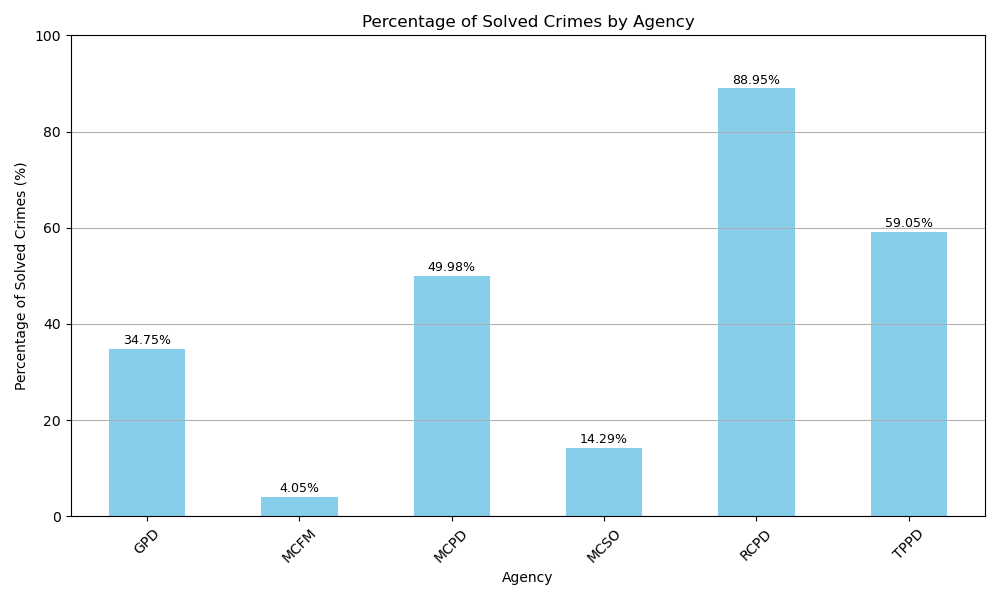

In [ ]:
# Filtering out unsolved crimes, null values and bad entries
montgomery_crime_df['Solved'] = ~(montgomery_crime_df['End_Date_Time'].isnull() | (montgomery_crime_df['End_Date_Time'] == 0))

# calculating solved percentage and grouping it by Agency
solved_percentage = montgomery_crime_df.groupby('Agency')['Solved'].mean() * 100

# Making a bar plot
plt.figure(figsize=(10, 6))
bars = solved_percentage.plot(kind='bar', color='skyblue')
plt.title('Percentage of Solved Crimes by Agency')
plt.xlabel('Agency')
plt.ylabel('Percentage of Solved Crimes (%)')
plt.xticks(rotation=45)
plt.ylim(0, 100)  # Set y-axis limit from 0 to 100 for percentage
plt.grid(axis='y')

# Adding percentage values over bars
for index, value in enumerate(solved_percentage):
    plt.text(index, value + 1, f'{value:.2f}%', ha='center', color='black', fontsize=9)
plt.tight_layout()
plt.show()

## Machine Learning & Statistics

<a name='A4'></a>

In [ ]:
#Importing Mandatory Libraries
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score

In [ ]:
crime_data = montgomery_crime_df[['Start_Date_Time', 'Crime Name1', 'Crime Name2',  'Zip Code', 'City','Year','Month_Name', 'Hour', 'Victims']]
crime_data.head()

,Start_Date_Time,Crime Name1,Crime Name2,Zip Code,City,Year,Month_Name,Hour,Victims
Incident ID,,,,,,,,,
201452140,2023-11-08 03:20:00,Crime Against Property,Robbery,20910.0,SILVER SPRING,2023,November,3,1
201452138,2023-11-08 02:30:00,Crime Against Property,Burglary/Breaking and Entering,20852.0,ROCKVILLE,2023,November,2,1
201452119,2023-11-07 21:15:00,Crime Against Property,False Pretenses/Swindle/Confidence Game,20906.0,SILVER SPRING,2023,November,21,1
201452132,2023-11-07 21:06:00,Crime Against Person,Aggravated Assault,20878.0,GAITHERSBURG,2023,November,21,5
201452133,2023-11-07 20:54:00,Crime Against Society,Disorderly Conduct,20877.0,GAITHERSBURG,2023,November,20,1


In [ ]:
bins = [-1, 5, 11, 17, 23]
labels = ['After Midnight', 'Morning', 'Afternoon', 'Evening']

# Create the 'time_category' column based on the 'hour' column
crime_data['Time_Category'] = pd.cut(crime_data['Hour'], bins=bins, labels=labels, right=False)

/tmp/ipykernel_31864/2571526610.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  crime_data['Time_Category'] = pd.cut(crime_data['Hour'], bins=bins, labels=labels, right=False)


In [ ]:
crime_data.head()

,Start_Date_Time,Crime Name1,Crime Name2,Zip Code,City,Year,Month_Name,Hour,Victims,Time_Category
Incident ID,,,,,,,,,,
201452140,2023-11-08 03:20:00,Crime Against Property,Robbery,20910.0,SILVER SPRING,2023,November,3,1,After Midnight
201452138,2023-11-08 02:30:00,Crime Against Property,Burglary/Breaking and Entering,20852.0,ROCKVILLE,2023,November,2,1,After Midnight
201452119,2023-11-07 21:15:00,Crime Against Property,False Pretenses/Swindle/Confidence Game,20906.0,SILVER SPRING,2023,November,21,1,Evening
201452132,2023-11-07 21:06:00,Crime Against Person,Aggravated Assault,20878.0,GAITHERSBURG,2023,November,21,5,Evening
201452133,2023-11-07 20:54:00,Crime Against Society,Disorderly Conduct,20877.0,GAITHERSBURG,2023,November,20,1,Evening


In [ ]:
# Selecting relevant columns
data = crime_data[['Zip Code', 'Time_Category', 'City', 'Month_Name']]
target = crime_data['Crime Name1']

# Convert categorical variables to numerical using one-hot encoding
data_encoded = pd.get_dummies(data, columns=['Zip Code', 'Time_Category','City', 'Month_Name'], drop_first=True)

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(data_encoded, target, test_size=0.2, random_state=42)

# Create a Random Forest Classifier
clf = RandomForestClassifier(n_estimators=100, random_state=42)

# Train the model
clf.fit(X_train, y_train)

# Make predictions on the test set
predictions = clf.predict(X_test)

# Evaluate the model
accuracy = accuracy_score(y_test, predictions)
print(f'Accuracy: {accuracy:.2f}')


Accuracy: 0.68


In [ ]:
input_data = pd.DataFrame({
   'Zip Code': ['20902'],
   'time_category': ['After Midnight'],
   'Month_Name': ['April']
})

# One-hot encode the input data
input_data_encoded = pd.get_dummies(input_data, columns=['Zip Code', 'time_category', 'Month_Name'], drop_first=True)


# Identify missing columns
missing_columns = set(X_train.columns) - set(input_data_encoded.columns)

# Create a dictionary to hold the new columns
new_columns = {}

# Add columns to the dictionary
for column in missing_columns:
   new_columns[column] = 0

# Create a new DataFrame from the dictionary
new_df = pd.DataFrame(new_columns, index=[0])

# Concatenate the new DataFrame with the existing DataFrame
input_data_encoded = pd.concat([input_data_encoded, new_df], axis=1)

# Reorder columns to match the training data
input_data_encoded = input_data_encoded[X_train.columns]

# Make a prediction
prediction = clf.predict(input_data_encoded)

print(f'Predicted Crime Category: {prediction[0]}')


Predicted Crime Category: Crime Against Property


**Correlation Matrix**

In [ ]:
corr = crime_data

In [ ]:
dummies = pd.get_dummies(corr[['Crime Name1', 'Time_Category']],columns=['Crime Name1', 'Time_Category'])

In [ ]:
dummies[['Victims','Year']] = corr[['Victims', 'Year']]
dummies

,Crime Name1_Crime Against Person,Crime Name1_Crime Against Property,Crime Name1_Crime Against Society,Time_Category_After Midnight,Time_Category_Morning,Time_Category_Afternoon,Time_Category_Evening,Victims,Year
Incident ID,,,,,,,,,
201452140,False,True,False,True,False,False,False,1,2023
201452138,False,True,False,True,False,False,False,1,2023
201452119,False,True,False,False,False,False,True,1,2023
201452132,True,False,False,False,False,False,True,5,2023
201452133,False,False,True,False,False,False,True,1,2023
...,...,...,...,...,...,...,...,...,...
201368726,False,True,False,False,True,False,False,1,2017
201181181,False,True,False,False,True,False,False,1,2017
201133509,False,True,False,True,False,False,False,1,2017


In [ ]:
grouped_data = dummies.groupby('Year').sum()

# Display the result DataFrame
grouped_data['Crime_Sum'] = dummies.groupby('Year').size()

In [ ]:
grouped_data

,Crime Name1_Crime Against Person,Crime Name1_Crime Against Property,Crime Name1_Crime Against Society,Time_Category_After Midnight,Time_Category_Morning,Time_Category_Afternoon,Time_Category_Evening,Victims,Crime_Sum
Year,,,,,,,,,
2017,2890,14973,5892,3621,2847,6969,9051,24340,23755
2018,3935,17536,8037,4450,3518,9138,10832,30347,29508
2019,3894,18452,6912,4321,3556,9091,10913,30066,29258
2020,3605,18672,3659,3713,3207,8390,9553,26756,25936
2021,4148,18485,2679,3960,3391,8236,8769,26198,25312
2022,4482,20192,3315,4424,3831,9086,9689,29042,27989
2023,3906,18667,2649,3400,3590,8274,9049,26123,25222


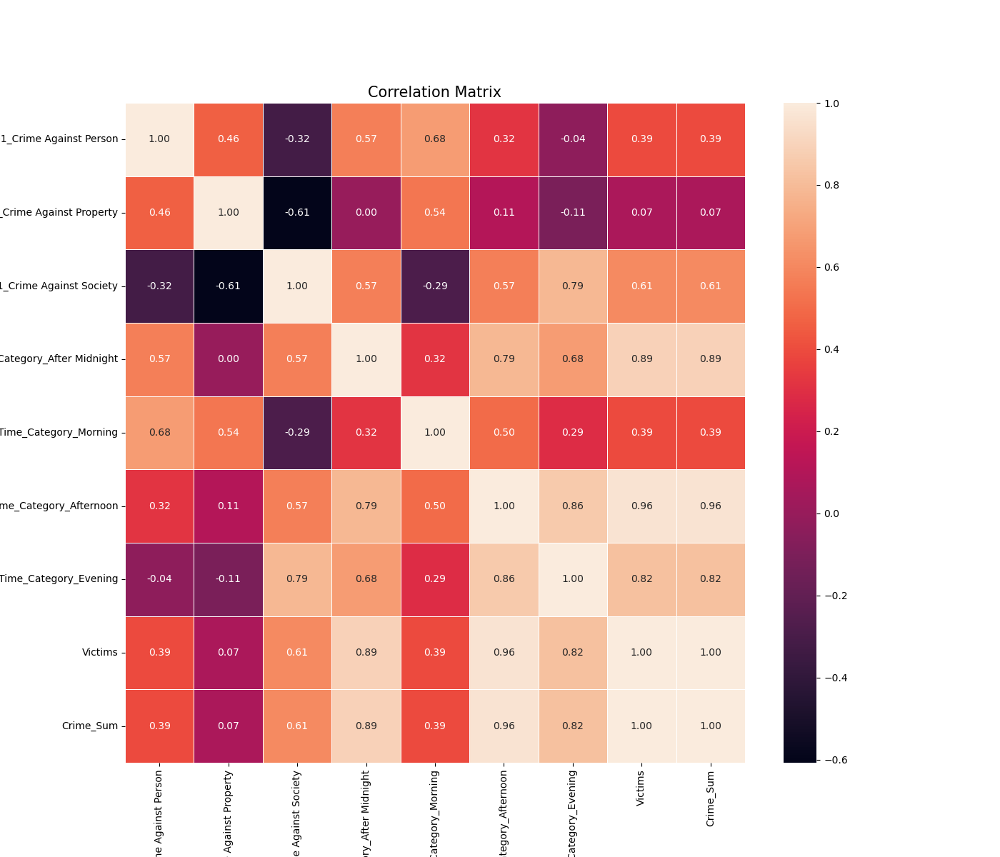

In [ ]:
from scipy.stats import spearmanr

corr = spearmanr(grouped_data).correlation
plt.figure(figsize=(14, 12))
ax = sns.heatmap(corr,
            annot=True,
            fmt='.2f',
            linewidths=.5,
            xticklabels=grouped_data.columns,
            yticklabels=grouped_data.columns)
ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
plt.title('Correlation Matrix', fontsize = 15)
plt.show()

- The correlation between 'Crime Sum' and 'Afternoon' is 0.96. This is a very high correlation, indicating a strong positive relationship. The afternoon might be a time when people are more likely to be out and about, which could increase the opportunities for crimes.

- The correlation between 'Crime Against Person' and 'After Midnight' is 0.86, and between 'Crime Against Person' and 'Morning' is 0.93. These correlations suggest a strong positive relationship between the time of the crime and the type of crime.
    - In particular, the correlation of 0.93 between 'Crime Against Person' and 'Morning' indicates that crimes against persons are more likely to occur in the morning. This could be due to various reasons such as the increased presence of people out and about during the morning hours.
    - Similarly, the correlation of 0.86 between 'Crime Against Person' and 'After Midnight' suggests that crimes against persons are also more likely to occur after midnight. This could be due to the fact that people are less likely to be out and about after midnight, which could reduce the opportunities for crimes against persons.

- The correlation between 'Victims' and 'Afternoon' is 0.89. This indicates a strong positive relationship, suggesting that the number of victims tends to be higher during the afternoon. This could be due to various reasons:
    - Increased Human Activity: The afternoon is often a time when people are more active. This could increase the opportunities for crimes, leading to more victims.
    - Specific Crime Patterns: Some types of crimes might be more likely to occur during the afternoon.
    - Reporting Time: Victims might be more likely to report crimes that occur during the afternoon. This could be due to various reasons, such as the fact that people are more awake and alert during this time, or the fact that the afternoon is a common reporting time for crimes.

# Conclusion

what we learned

what we recommend

remaining questions?

# References


Councilmanic. Montgomery County GIS Open Data 2.0, MD. (n.d.). https://opendata-mcgov-gis.hub.arcgis.com/datasets/mcgov-gis::councilmanic/explore?location=39.142744%2C-77.208800%2C10.87

Wikimedia Foundation. (2023, November 25). Montgomery County, Maryland. Wikipedia. https://en.wikipedia.org/wiki/Montgomery_County,_Maryland

Crimes against persons, property, and Society - Federal Bureau of ... (n.d.). https://ucr.fbi.gov/nibrs/2018/resource-pages/crimes_against_persons_property_and_society-2018.pdf

<a name='References'></a>

# Glossary

__Sector/Beat__: a specific area or geographical territory to which a patrol officer is assigned (beat is a subdivision of sector).

__Crime Start Time__: when a crime is reported, either to or by police.

__Crime End Time__: when the case for a crime is closed by police.

__Dispatch Time__: when a police office/unit is sent to the scene of a crime.
<a name='Glossary'></a>